# Homework 6


For this homework, we will be exploring a gene expression dataset profiling T cells derived from thymic and peripheral blood sources, as described in the study [GSE139242](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE139242) and the accompanying paper [PMID: 32393182](https://bmcgenomics.biomedcentral.com/articles/10.1186/s12864-020-6755-1).


### Prep
Start by Installing and Importing the necessary packages. Note that we will need to set some specific settings to get everything to run properly in Colaboratory.




In [1]:
# Import required libraries
import numpy as np
import pandas as pd
import scipy
from scipy import stats
import statsmodels.stats.multitest as smm
import matplotlib.pyplot as plt
from statsmodels.formula.api import ols
import seaborn as sns
import csv
import os
import sys
import argparse
from time import time

import altair as alt
import scipy.spatial as sp, scipy.cluster.hierarchy as hc


In [2]:
pd.set_option('display.precision', 2)
pd.set_option('display.max_columns',10)

alt.data_transformers.disable_max_rows()

# We're also going to tell Jupyter to use inline plotting instead of notebook plotting
# It basically means you don't have to use plt.show() in every cell
%matplotlib inline

# and this command will allow multiple outputs from the same cell, rather than just the last one run
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

Setting up some other Pandas and python presets

In [3]:
import  scipy.signal.signaltools

def _centered(arr, newsize):
    # Return the center newsize portion of the array.
    newsize = np.asarray(newsize)
    currsize = np.array(arr.shape)
    startind = (currsize - newsize) // 2
    endind = startind + newsize
    myslice = [slice(startind[k], endind[k]) for k in range(len(endind))]
    return arr[tuple(myslice)]

scipy.signal.signaltools._centered = _centered

In [4]:
from scipy.signal.signaltools import _centered as trim_centered

In [ ]:
pip install pydeseq2

In [5]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

### Importing Data

Let's start by importing the datasets `GSE139242_gene_counts.csv` and `GSE139242_meta.csv`:

In [ ]:
# A way to bring in Data
#from google.colab import files
#uploaded = files.upload()

In [6]:
import pandas as pd
# importing the T cell expression dataset
#data_counts = pd.read_csv('GSE139242_gene_counts.csv',index_col = 0)
data_counts = pd.read_csv(r"C:\Users\Kathleen\OneDrive\Documents\Bioinformatics Spring 2024\Homework\Homework 6\GSE139242_gene_counts.csv", index_col=0)

data_counts = data_counts.transpose()
data_counts

,A1BG,A1BG-AS1,A2M,A2M-AS1,A2ML1,...,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
CD4_thymus_1,52.0,232.0,47.0,99.0,3.0,...,1750.0,4785.0,542.0,3567.0,6686.0
CD4_thymus_2,46.0,308.0,68.0,89.0,23.0,...,3233.0,6200.0,1706.0,6227.0,8707.0
CD4_thymus_3,175.0,752.0,72.0,249.0,41.0,...,5627.0,13077.0,1261.0,8991.0,18927.0
CD4_thymus_4,63.0,360.0,38.0,130.0,100.0,...,2928.0,4221.0,1532.0,5731.0,6987.0
CD4_bloodinfant_1,16.0,162.0,1.0,408.0,0.0,...,3191.0,5560.0,1779.0,5541.0,10476.0
CD4_bloodinfant_2,5.0,96.0,5.0,320.0,0.0,...,3604.0,5986.0,2893.0,8669.0,11672.0
CD4_bloodinfant_3,6.0,184.0,4.0,267.0,0.0,...,2907.0,5408.0,1721.0,6909.0,8751.0
CD4_bloodinfant_4,18.0,96.0,9.0,1471.0,0.0,...,2625.0,3391.0,998.0,7253.0,7152.0
CD8_thymus_1,47.0,806.0,120.0,166.0,291.0,...,2561.0,3149.0,3201.0,8527.0,5869.0
CD8_thymus_2,9.0,226.0,89.0,18.0,42.0,...,576.0,935.0,746.0,1851.0,1868.0


In [7]:
import pandas as pd
# importing the metadata
#meta = pd.read_csv('GSE139242_metaB.csv',index_col = 0)
meta = pd.read_csv(r"C:\Users\Kathleen\OneDrive\Documents\Bioinformatics Spring 2024\Homework\Homework 6\GSE139242_meta.csv")

meta.shape
meta


(16, 4)

,SampleID,CellType,Source,Replicate
0,CD4_thymus_1,CD4,thymus,1
1,CD4_thymus_2,CD4,thymus,2
2,CD4_thymus_3,CD4,thymus,3
3,CD4_thymus_4,CD4,thymus,4
4,CD4_bloodinfant_1,CD4,blood,1
5,CD4_bloodinfant_2,CD4,blood,2
6,CD4_bloodinfant_3,CD4,blood,3
7,CD4_bloodinfant_4,CD4,blood,4
8,CD8_thymus_1,CD8,thymus,1
9,CD8_thymus_2,CD8,thymus,2


### Prepping the data: Calculating DESeq2 differential gene expression analysis for every pairwise group comparison between type of T cell and source of cell.

This is optional to step through. To save time, the outputs of this code block are provided as .csv files that you can directly load.

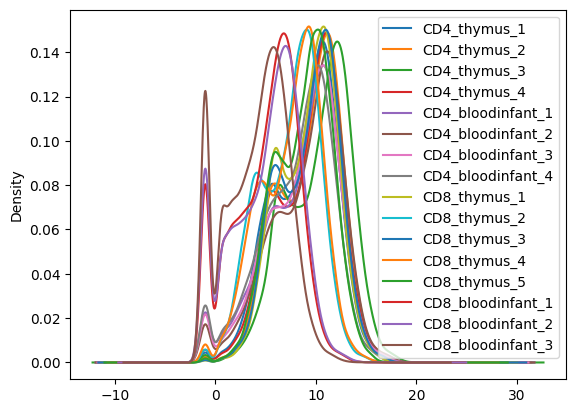

In [8]:
counts_log2 = np.log2(data_counts + 0.5) # creates the data frame with the log2-transformed count
counts_log2.transpose().plot(kind='density'); # plots the density

In [9]:
#Calculate mean and variability
meanLog2 = counts_log2.mean() #calculates log2 mean across samples for each gene.
meanLog2.head()
variabilityLog2 = np.sqrt(counts_log2.std())


A1BG        4.03
A1BG-AS1    7.44
A2M         4.18
A2M-AS1     6.29
A2ML1       2.78
dtype: float64

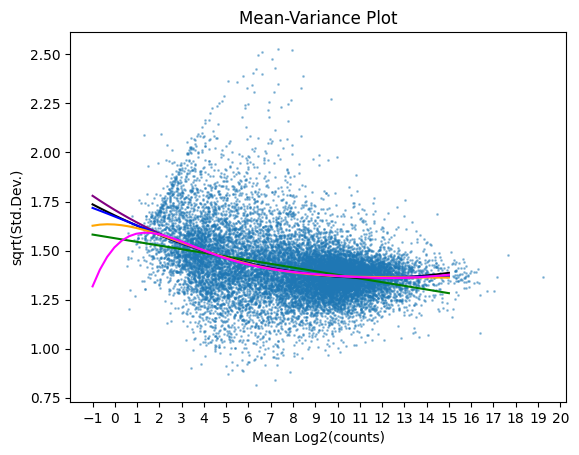

In [10]:

#fit polynomial models up to degree 4
model1 = np.poly1d(np.polyfit(meanLog2, variabilityLog2, 1))
model2 = np.poly1d(np.polyfit(meanLog2, variabilityLog2, 2))
model3 = np.poly1d(np.polyfit(meanLog2, variabilityLog2, 3))
model4 = np.poly1d(np.polyfit(meanLog2, variabilityLog2, 4))
model5 = np.poly1d(np.polyfit(meanLog2, variabilityLog2, 5))
model6 = np.poly1d(np.polyfit(meanLog2, variabilityLog2, 6))

#create scatterplot
polyline = np.linspace(-1, 15,50 )

#now plot the mean-variability for Blood as a scatterplot
plt.scatter(meanLog2, variabilityLog2, alpha=0.4,s = 1);
plt.plot(polyline, model1(polyline), color='green');
plt.plot(polyline, model2(polyline), color='black');
plt.plot(polyline, model3(polyline), color='purple');
plt.plot(polyline, model4(polyline), color='blue');
plt.plot(polyline, model5(polyline), color='orange');
plt.plot(polyline, model6(polyline), color='magenta');
plt.title("Mean-Variance Plot");
plt.xlabel("Mean Log2(counts)");
plt.ylabel("sqrt(Std.Dev.)");
plt.xticks(np.arange(-1, 21,1));



Based on this plot, we'll keep genes with meanLog2 > 2.

<Axes: ylabel='Density'>

(16, 15825)

,A1BG,A1BG-AS1,A2M,A2M-AS1,A2ML1,...,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
CD4_thymus_1,52.0,232.0,47.0,99.0,3.0,...,1750.0,4785.0,542.0,3567.0,6686.0
CD4_thymus_2,46.0,308.0,68.0,89.0,23.0,...,3233.0,6200.0,1706.0,6227.0,8707.0
CD4_thymus_3,175.0,752.0,72.0,249.0,41.0,...,5627.0,13077.0,1261.0,8991.0,18927.0
CD4_thymus_4,63.0,360.0,38.0,130.0,100.0,...,2928.0,4221.0,1532.0,5731.0,6987.0
CD4_bloodinfant_1,16.0,162.0,1.0,408.0,0.0,...,3191.0,5560.0,1779.0,5541.0,10476.0


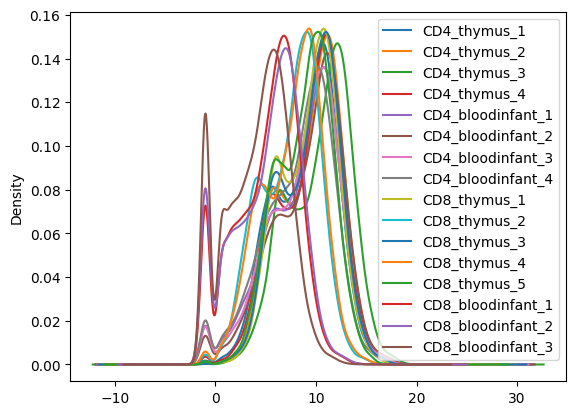

In [11]:
keepMeanAll = meanLog2 > 2 #keeps genes with log2 mean values across samples greater than 2.
counts_log2_meanTrimmed = counts_log2.loc[:,keepMeanAll] #trimming the log2 counts
counts_log2_meanTrimmed.transpose().plot(kind='density'); #plotting the density plot for the log2-transformed samples, with the trimmed data frame


counts_meanTrimmed = data_counts.loc[:,keepMeanAll] #trimming the raw counts
counts_meanTrimmed.shape
counts_meanTrimmed.head()

In [12]:
counts_meanTrimmed

,A1BG,A1BG-AS1,A2M,A2M-AS1,A2ML1,...,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
CD4_thymus_1,52.0,232.0,47.0,99.0,3.0,...,1750.0,4785.0,542.0,3567.0,6686.0
CD4_thymus_2,46.0,308.0,68.0,89.0,23.0,...,3233.0,6200.0,1706.0,6227.0,8707.0
CD4_thymus_3,175.0,752.0,72.0,249.0,41.0,...,5627.0,13077.0,1261.0,8991.0,18927.0
CD4_thymus_4,63.0,360.0,38.0,130.0,100.0,...,2928.0,4221.0,1532.0,5731.0,6987.0
CD4_bloodinfant_1,16.0,162.0,1.0,408.0,0.0,...,3191.0,5560.0,1779.0,5541.0,10476.0
CD4_bloodinfant_2,5.0,96.0,5.0,320.0,0.0,...,3604.0,5986.0,2893.0,8669.0,11672.0
CD4_bloodinfant_3,6.0,184.0,4.0,267.0,0.0,...,2907.0,5408.0,1721.0,6909.0,8751.0
CD4_bloodinfant_4,18.0,96.0,9.0,1471.0,0.0,...,2625.0,3391.0,998.0,7253.0,7152.0
CD8_thymus_1,47.0,806.0,120.0,166.0,291.0,...,2561.0,3149.0,3201.0,8527.0,5869.0
CD8_thymus_2,9.0,226.0,89.0,18.0,42.0,...,576.0,935.0,746.0,1851.0,1868.0


Running DESeq2 to get the log2 fold changes between each pairwise comparison.

In [13]:
def DESeq2Wrapper(counts, metadata,comparison):
  dds = DeseqDataSet(counts = counts, metadata = metadata, design_factors=comparison)
  dds.deseq2()
  deseq_stats = DeseqStats(dds,alpha = 0.05)
  deseq_stats.summary()
  return deseq_stats.results_df


In [14]:
# Align the indices of the 'meta' DataFrame to match 'counts_meanTrimmed'
meta.set_index('SampleID', inplace=True)




In [15]:
CD4_ThymusVsBlood_DESeqResults = DESeq2Wrapper(counts_meanTrimmed.loc[meta.CellType == 'CD4',:],meta.loc[meta.CellType == 'CD4',:],'Source')
CD8_ThymusVsBlood_DESeqResults = DESeq2Wrapper(counts_meanTrimmed.loc[meta.CellType == 'CD8',:],meta.loc[meta.CellType == 'CD8',:],'Source')
Thymus_CD4VsCD8_DESeqResults = DESeq2Wrapper(counts_meanTrimmed.loc[meta.Source == 'thymus',:],meta.loc[meta.Source == 'thymus',:],'CellType')
Blood_CD4VsCD8_DESeqResults = DESeq2Wrapper(counts_meanTrimmed.loc[meta.Source == 'blood',:],meta.loc[meta.Source == 'blood',:],'CellType')

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 4.18 seconds.

Fitting dispersion trend curve...
... done in 0.60 seconds.

Fitting MAP dispersions...
... done in 5.16 seconds.

Fitting LFCs...
... done in 2.87 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.15 seconds.



Log2 fold change & Wald test p-value: Source thymus vs blood
          baseMean  log2FoldChange  lfcSE  stat    pvalue      padj
A1BG         38.03            2.06   0.61  3.35  8.07e-04  2.24e-03
A1BG-AS1    237.02            0.93   0.30  3.06  2.20e-03  5.49e-03
A2M          26.39            2.94   0.69  4.24  2.21e-05  8.72e-05
A2M-AS1     496.51           -3.01   0.76 -3.98  6.79e-05  2.41e-04
A2ML1        17.67            7.32   2.00  3.66  2.55e-04  7.91e-04
...            ...             ...    ...   ...       ...       ...
ZXDC       3140.77           -0.51   0.17 -3.05  2.31e-03  5.73e-03
ZYG11B     5640.85           -0.17   0.16 -1.08  2.79e-01  3.63e-01
ZYX        1573.30           -0.99   0.32 -3.04  2.39e-03  5.91e-03
ZZEF1      6742.52           -0.83   0.22 -3.75  1.74e-04  5.58e-04
ZZZ3       9503.41           -0.53   0.13 -4.06  4.98e-05  1.82e-04

[15825 rows x 6 columns]


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 4.36 seconds.

Fitting dispersion trend curve...
... done in 0.62 seconds.

Fitting MAP dispersions...
... done in 4.97 seconds.

Fitting LFCs...
... done in 2.50 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.76 seconds.



Log2 fold change & Wald test p-value: Source thymus vs blood
          baseMean  log2FoldChange  lfcSE  stat    pvalue      padj
A1BG          9.14            0.48   0.79  0.60  5.47e-01  6.43e-01
A1BG-AS1    139.56            0.57   0.27  2.08  3.77e-02  7.60e-02
A2M          37.83            3.30   0.90  3.67  2.44e-04  1.04e-03
A2M-AS1      24.41            0.17   0.55  0.31  7.60e-01  8.22e-01
A2ML1        27.45            5.69   1.97  2.89  3.91e-03  1.15e-02
...            ...             ...    ...   ...       ...       ...
ZXDC        646.74           -0.63   0.24 -2.62  8.83e-03  2.32e-02
ZYG11B      773.17           -0.09   0.17 -0.56  5.74e-01  6.68e-01
ZYX         916.10           -1.30   0.24 -5.38  7.50e-08  6.83e-07
ZZEF1      1851.42           -0.32   0.23 -1.40  1.60e-01  2.44e-01
ZZZ3       1443.02            0.17   0.14  1.18  2.36e-01  3.32e-01

[15825 rows x 6 columns]


Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 4.02 seconds.

Fitting dispersion trend curve...
... done in 0.66 seconds.

Fitting MAP dispersions...
... done in 5.15 seconds.

Fitting LFCs...
... done in 2.40 seconds.

Replacing 0 outlier genes.

Running Wald tests...
... done in 1.17 seconds.



Log2 fold change & Wald test p-value: CellType CD8 vs CD4
          baseMean  log2FoldChange  lfcSE  stat    pvalue      padj
A1BG         41.10           -0.39   0.36 -1.09  2.75e-01  3.60e-01
A1BG-AS1    420.80            1.20   0.18  6.83  8.62e-12  1.56e-10
A2M         128.64            2.47   0.39  6.32  2.68e-10  3.46e-09
A2M-AS1      87.02            0.06   0.32  0.20  8.43e-01  8.84e-01
A2ML1        98.43            2.50   0.84  2.99  2.81e-03  6.76e-03
...            ...             ...    ...   ...       ...       ...
ZXDC       1948.47           -0.11   0.17 -0.63  5.31e-01  6.17e-01
ZYG11B     3340.66           -0.64   0.13 -4.78  1.80e-06  9.92e-06
ZYX        1526.14            1.33   0.30  4.48  7.33e-06  3.48e-05
ZZEF1      5003.52            0.64   0.20  3.29  1.02e-03  2.76e-03
ZZZ3       5661.72           -0.20   0.11 -1.76  7.92e-02  1.25e-01

[15825 rows x 6 columns]


Fitting size factors...
... done in 0.01 seconds.

Fitting dispersions...
... done in 4.24 seconds.

Fitting dispersion trend curve...
... done in 0.64 seconds.

Fitting MAP dispersions...
... done in 4.54 seconds.

Fitting LFCs...
... done in 2.58 seconds.

Replacing 0 outlier genes.

Running Wald tests...


Log2 fold change & Wald test p-value: CellType CD8 vs CD4
          baseMean  log2FoldChange  lfcSE  stat    pvalue      padj
A1BG          5.68            1.21   1.14  1.06  2.88e-01  4.44e-01
A1BG-AS1     73.73            1.61   0.43  3.78  1.55e-04  1.05e-03
A2M           3.31            2.02   1.59  1.27  2.04e-01       NaN
A2M-AS1     134.02           -3.06   0.81 -3.79       NaN       NaN
A2ML1         0.00             NaN    NaN   NaN       NaN       NaN
...            ...             ...    ...   ...       ...       ...
ZXDC        908.94            0.06   0.23  0.25  8.05e-01  8.76e-01
ZYG11B     1205.49           -0.67   0.21 -3.28  1.04e-03  5.33e-03
ZYX         985.36            1.70   0.23  7.47  7.98e-14  2.79e-12
ZZEF1      2204.72            0.19   0.25  0.76  4.50e-01  6.02e-01
ZZZ3       2192.36           -0.85   0.18 -4.87  1.13e-06  1.38e-05

[15825 rows x 6 columns]


... done in 1.14 seconds.



In [16]:
CD4_ThymusVsBlood_DESeqResults.to_csv('CD4_ThymusVsBlood_DESeqResults.csv')
CD8_ThymusVsBlood_DESeqResults.to_csv('CD8_ThymusVsBlood_DESeqResults.csv')
Thymus_CD4VsCD8_DESeqResults.to_csv('Thymus_CD4VsCD8_DESeqResults.csv')
Blood_CD4VsCD8_DESeqResults.to_csv('Blood_CD4VsCD8_DESeqResults.csv')

##Questions

In [17]:
# Run this block to upload the data frames that would otherwise be generated from the "Prepping the data" section.
CD4_ThymusVsBlood_DESeqResults = pd.read_csv('CD4_ThymusVsBlood_DESeqResults.csv',index_col = 0)
CD8_ThymusVsBlood_DESeqResults = pd.read_csv('CD8_ThymusVsBlood_DESeqResults.csv',index_col = 0)
Thymus_CD4VsCD8_DESeqResults = pd.read_csv('Thymus_CD4VsCD8_DESeqResults.csv',index_col = 0)
Blood_CD4VsCD8_DESeqResults = pd.read_csv('Blood_CD4VsCD8_DESeqResults.csv',index_col = 0)

1. This question will prepare a data frame that is compatible with setting up interactive plots in `altair`. The important thing about making that work is to consolidate a large data frame that has separate columns to represent each of the axes that you want to show in your interactively linked plots, as well as any other metadata columns. `altair` can link information on the same row in different columns into different, connected plots.





* Add to `Thymus_CD4VsCD8_DESeqResults` and `Blood_CD4VsCD8_DESeqResults` a new column, containing the -Log10 transformed adjusted p-values that are reported in those two data frames.



In [18]:


import numpy as np
# Add new columns containing log 10 transformed adj p values 
Thymus_CD4VsCD8_DESeqResults['-Log10_adj_pvalue'] = -np.log10(Thymus_CD4VsCD8_DESeqResults['padj'])
Blood_CD4VsCD8_DESeqResults['-Log10_adj_pvalue'] = -np.log10(Blood_CD4VsCD8_DESeqResults['padj'])


In [19]:
Thymus_CD4VsCD8_DESeqResults

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,-Log10_adj_pvalue
A1BG,41.10,-0.39,0.36,-1.09,2.75e-01,3.60e-01,0.44
A1BG-AS1,420.80,1.20,0.18,6.83,8.62e-12,1.56e-10,9.81
A2M,128.64,2.47,0.39,6.32,2.68e-10,3.46e-09,8.46
A2M-AS1,87.02,0.06,0.32,0.20,8.43e-01,8.84e-01,0.05
A2ML1,98.43,2.50,0.84,2.99,2.81e-03,6.76e-03,2.17
...,...,...,...,...,...,...,...
ZXDC,1948.47,-0.11,0.17,-0.63,5.31e-01,6.17e-01,0.21
ZYG11B,3340.66,-0.64,0.13,-4.78,1.80e-06,9.92e-06,5.00
ZYX,1526.14,1.33,0.30,4.48,7.33e-06,3.48e-05,4.46
ZZEF1,5003.52,0.64,0.20,3.29,1.02e-03,2.76e-03,2.56


In [20]:
Blood_CD4VsCD8_DESeqResults

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,-Log10_adj_pvalue
A1BG,5.68,1.21,1.14,1.06,2.88e-01,4.44e-01,0.35
A1BG-AS1,73.73,1.61,0.43,3.78,1.55e-04,1.05e-03,2.98
A2M,3.31,2.02,1.59,1.27,2.04e-01,NaN,NaN
A2M-AS1,134.02,-3.06,0.81,-3.79,NaN,NaN,NaN
A2ML1,0.00,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
ZXDC,908.94,0.06,0.23,0.25,8.05e-01,8.76e-01,0.06
ZYG11B,1205.49,-0.67,0.21,-3.28,1.04e-03,5.33e-03,2.27
ZYX,985.36,1.70,0.23,7.47,7.98e-14,2.79e-12,11.55
ZZEF1,2204.72,0.19,0.25,0.76,4.50e-01,6.02e-01,0.22


* Add to `Thymus_CD4VsCD8_DESeqResults` and `Blood_CD4VsCD8_DESeqResults` a new column, which says `True` in the rows where the adjusted p-value is < 0.05, and `False` in the rows where the adjusted p-value is not less.

In [21]:
Thymus_CD4VsCD8_DESeqResults['Significant'] = Thymus_CD4VsCD8_DESeqResults['padj'] < 0.05
Blood_CD4VsCD8_DESeqResults['Significant'] = Blood_CD4VsCD8_DESeqResults['padj'] < 0.05


In [22]:
Thymus_CD4VsCD8_DESeqResults

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,-Log10_adj_pvalue,Significant
A1BG,41.10,-0.39,0.36,-1.09,2.75e-01,3.60e-01,0.44,False
A1BG-AS1,420.80,1.20,0.18,6.83,8.62e-12,1.56e-10,9.81,True
A2M,128.64,2.47,0.39,6.32,2.68e-10,3.46e-09,8.46,True
A2M-AS1,87.02,0.06,0.32,0.20,8.43e-01,8.84e-01,0.05,False
A2ML1,98.43,2.50,0.84,2.99,2.81e-03,6.76e-03,2.17,True
...,...,...,...,...,...,...,...,...
ZXDC,1948.47,-0.11,0.17,-0.63,5.31e-01,6.17e-01,0.21,False
ZYG11B,3340.66,-0.64,0.13,-4.78,1.80e-06,9.92e-06,5.00,True
ZYX,1526.14,1.33,0.30,4.48,7.33e-06,3.48e-05,4.46,True
ZZEF1,5003.52,0.64,0.20,3.29,1.02e-03,2.76e-03,2.56,True


In [23]:
Blood_CD4VsCD8_DESeqResults

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,-Log10_adj_pvalue,Significant
A1BG,5.68,1.21,1.14,1.06,2.88e-01,4.44e-01,0.35,False
A1BG-AS1,73.73,1.61,0.43,3.78,1.55e-04,1.05e-03,2.98,True
A2M,3.31,2.02,1.59,1.27,2.04e-01,NaN,NaN,False
A2M-AS1,134.02,-3.06,0.81,-3.79,NaN,NaN,NaN,False
A2ML1,0.00,NaN,NaN,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...
ZXDC,908.94,0.06,0.23,0.25,8.05e-01,8.76e-01,0.06,False
ZYG11B,1205.49,-0.67,0.21,-3.28,1.04e-03,5.33e-03,2.27,True
ZYX,985.36,1.70,0.23,7.47,7.98e-14,2.79e-12,11.55,True
ZZEF1,2204.72,0.19,0.25,0.76,4.50e-01,6.02e-01,0.22,False




* Rename the columns of `Thymus_CD4VsCD8_DESeqResults` and `Blood_CD4VsCD8_DESeqResults` so that it is possible to tell which comparison was used to generate the respective metrics. This enable us to concatenate the two data frames together, without having duplicate column names.



In [24]:
# Rename 

# Rename columns of Thymus_CD4VsCD8_DESeqResults
Thymus_CD4VsCD8_DESeqResults = Thymus_CD4VsCD8_DESeqResults.rename(columns={
    'baseMean': 'Thymus_baseMean',
    'log2FoldChange': 'Thymus_log2FoldChange',
    'lfcSE': 'Thymus_lfcSE',
    'stat': 'Thymus_stat',
    'pvalue': 'Thymus_pvalue',
    'padj': 'Thymus_padj',
    '-Log10_adj_pvalue': 'Thymus_-Log10_adj_pvalue',
    'Significant': 'Thymus_Significant'
})

# Rename columns of Blood_CD4VsCD8_DESeqResults
Blood_CD4VsCD8_DESeqResults = Blood_CD4VsCD8_DESeqResults.rename(columns={
    'baseMean': 'Blood_baseMean',
    'log2FoldChange': 'Blood_log2FoldChange',
    'lfcSE': 'Blood_lfcSE',
    'stat': 'Blood_stat',
    'pvalue': 'Blood_pvalue',
    'padj': 'Blood_padj',
    '-Log10_adj_pvalue': 'Blood_-Log10_adj_pvalue',
    'Significant': 'Blood_Significant'
})





* Concatenate the modified versions of `Thymus_CD4VsCD8_DESeqResults` and `Blood_CD4VsCD8_DESeqResults` into a single data frame.


In [25]:
import pandas as pd
# Concatenate the dataframes


# Assuming you have modified versions of the data frames
modified_thymus_results = Thymus_CD4VsCD8_DESeqResults.copy()
modified_blood_results = Blood_CD4VsCD8_DESeqResults.copy()

# Concatenate the data frames
concatenated_results = pd.concat([modified_thymus_results, modified_blood_results], axis=1)

# Print the concatenated data frame
print(concatenated_results)




          Thymus_baseMean  Thymus_log2FoldChange  Thymus_lfcSE  Thymus_stat  \
A1BG                41.10                  -0.39          0.36        -1.09   
A1BG-AS1           420.80                   1.20          0.18         6.83   
A2M                128.64                   2.47          0.39         6.32   
A2M-AS1             87.02                   0.06          0.32         0.20   
A2ML1               98.43                   2.50          0.84         2.99   
...                   ...                    ...           ...          ...   
ZXDC              1948.47                  -0.11          0.17        -0.63   
ZYG11B            3340.66                  -0.64          0.13        -4.78   
ZYX               1526.14                   1.33          0.30         4.48   
ZZEF1             5003.52                   0.64          0.20         3.29   
ZZZ3              5661.72                  -0.20          0.11        -1.76   

          Thymus_pvalue  ...  Blood_stat  Blood_pva



* Remove rows that have any NaN or NA values.

In [26]:
# Remove Nan 
concatenated_results

,Thymus_baseMean,Thymus_log2FoldChange,Thymus_lfcSE,Thymus_stat,Thymus_pvalue,...,Blood_stat,Blood_pvalue,Blood_padj,Blood_-Log10_adj_pvalue,Blood_Significant
A1BG,41.10,-0.39,0.36,-1.09,2.75e-01,...,1.06,2.88e-01,4.44e-01,0.35,False
A1BG-AS1,420.80,1.20,0.18,6.83,8.62e-12,...,3.78,1.55e-04,1.05e-03,2.98,True
A2M,128.64,2.47,0.39,6.32,2.68e-10,...,1.27,2.04e-01,NaN,NaN,False
A2M-AS1,87.02,0.06,0.32,0.20,8.43e-01,...,-3.79,NaN,NaN,NaN,False
A2ML1,98.43,2.50,0.84,2.99,2.81e-03,...,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,1948.47,-0.11,0.17,-0.63,5.31e-01,...,0.25,8.05e-01,8.76e-01,0.06,False
ZYG11B,3340.66,-0.64,0.13,-4.78,1.80e-06,...,-3.28,1.04e-03,5.33e-03,2.27,True
ZYX,1526.14,1.33,0.30,4.48,7.33e-06,...,7.47,7.98e-14,2.79e-12,11.55,True
ZZEF1,5003.52,0.64,0.20,3.29,1.02e-03,...,0.76,4.50e-01,6.02e-01,0.22,False


In [27]:
# Remove Nan
concatenated_results = concatenated_results.dropna()


In [28]:
concatenated_results

,Thymus_baseMean,Thymus_log2FoldChange,Thymus_lfcSE,Thymus_stat,Thymus_pvalue,...,Blood_stat,Blood_pvalue,Blood_padj,Blood_-Log10_adj_pvalue,Blood_Significant
A1BG,41.10,-0.39,0.36,-1.09,2.75e-01,...,1.06,2.88e-01,4.44e-01,0.35,False
A1BG-AS1,420.80,1.20,0.18,6.83,8.62e-12,...,3.78,1.55e-04,1.05e-03,2.98,True
AAAS,1373.09,-0.14,0.15,-0.93,3.51e-01,...,1.36,1.75e-01,3.12e-01,0.51,False
AACS,1157.95,-0.66,0.15,-4.49,6.98e-06,...,-1.00,3.17e-01,4.75e-01,0.32,False
AAGAB,2414.78,-0.43,0.16,-2.70,6.96e-03,...,0.72,4.73e-01,6.24e-01,0.20,False
...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,1948.47,-0.11,0.17,-0.63,5.31e-01,...,0.25,8.05e-01,8.76e-01,0.06,False
ZYG11B,3340.66,-0.64,0.13,-4.78,1.80e-06,...,-3.28,1.04e-03,5.33e-03,2.27,True
ZYX,1526.14,1.33,0.30,4.48,7.33e-06,...,7.47,7.98e-14,2.79e-12,11.55,True
ZZEF1,5003.52,0.64,0.20,3.29,1.02e-03,...,0.76,4.50e-01,6.02e-01,0.22,False


2. Use `altair` to generate a static volcano plot to summarize the differential gene expression analysis comparing CD4 and CD8 cells in the thymus. You'll need to plot the `log2FoldChange` for the Thymus CD4 vs. CD8 comparison on the x-axis, and the `-Log10` of the adjusted p-values for the Thymus CD4 vs. CD8 comparison on the y-axis. Color the points according to whether they have an adjusted p < 0.05.

*Hint*: You should use `DESeq2Results_AllPairwise` as the input dataframe. You'll be able to refer



In [29]:
# Assuming concatenated_results is already defined as a DataFrame; Set 'concatenated_results' equivalent to DESeq2Results_AllPairwise
DESeq2Results_AllPairwise = concatenated_results


In [30]:
DESeq2Results_AllPairwise

,Thymus_baseMean,Thymus_log2FoldChange,Thymus_lfcSE,Thymus_stat,Thymus_pvalue,...,Blood_stat,Blood_pvalue,Blood_padj,Blood_-Log10_adj_pvalue,Blood_Significant
A1BG,41.10,-0.39,0.36,-1.09,2.75e-01,...,1.06,2.88e-01,4.44e-01,0.35,False
A1BG-AS1,420.80,1.20,0.18,6.83,8.62e-12,...,3.78,1.55e-04,1.05e-03,2.98,True
AAAS,1373.09,-0.14,0.15,-0.93,3.51e-01,...,1.36,1.75e-01,3.12e-01,0.51,False
AACS,1157.95,-0.66,0.15,-4.49,6.98e-06,...,-1.00,3.17e-01,4.75e-01,0.32,False
AAGAB,2414.78,-0.43,0.16,-2.70,6.96e-03,...,0.72,4.73e-01,6.24e-01,0.20,False
...,...,...,...,...,...,...,...,...,...,...,...
ZXDC,1948.47,-0.11,0.17,-0.63,5.31e-01,...,0.25,8.05e-01,8.76e-01,0.06,False
ZYG11B,3340.66,-0.64,0.13,-4.78,1.80e-06,...,-3.28,1.04e-03,5.33e-03,2.27,True
ZYX,1526.14,1.33,0.30,4.48,7.33e-06,...,7.47,7.98e-14,2.79e-12,11.55,True
ZZEF1,5003.52,0.64,0.20,3.29,1.02e-03,...,0.76,4.50e-01,6.02e-01,0.22,False


In [32]:
import pandas as pd
import altair as alt



# Create a new column for coloring based on the adjusted p-value condition

DESeq2Results_AllPairwise.loc[:, 'color'] = DESeq2Results_AllPairwise['Blood_padj'].apply(lambda x: 'Significant' if x < 0.05 else 'Not Significant')




# Generate the volcano plot
volcano_plot = alt.Chart(DESeq2Results_AllPairwise).mark_point().encode(
    x=alt.X('Thymus_log2FoldChange:Q', title='Log2 Fold Change (Thymus CD4 vs. CD8)'),
    y=alt.Y('Blood_-Log10_adj_pvalue:Q', title='Log10 Adjusted P-value(Blood CD4 vs. CD8)'),
    color=alt.Color('color:N', legend=alt.Legend(title="Adjusted P-value < 0.05"))
).properties(
    title="Volcano Plot: Differential Gene Expression in Thymus CD4 vs CD8 Cells",
    width=600,
    height=400
)

# To display the plot in a Jupyter notebook
volcano_plot


alt.Chart(...)

4. Use `seaborn` to generate a clustermap of log2 fold change expression for genes that have an adjusted p < 0.05 and an absolute value of log2 fold change greater than 3, when comparing CD4 vs. CD8 in the thymus. Plot all 16 samples. To plot the log2 fold change expression, take each of sample's log2 expression and subtract from it the mean log2 expression across samples in the CD4 thymus group. Use a divergent colormap to accentuate and differentiate positive and negative fold change values. Set the limits of the colorbar to be from -10 to 10 (*Hint*: use `vmin/vmax` to set this).

Based on the dendrogram that gets generated directly from `seaborn` with this clustermap, is expression from CD8 cells from the thymus more similar to expression from CD4 cells from the thymus or expression from CD8 cells from the blood?

In [33]:
# Genes of Focus 

GenesofFocus = DESeq2Results_AllPairwise[(DESeq2Results_AllPairwise.Blood_padj < 0.05) & (abs(DESeq2Results_AllPairwise.Thymus_log2FoldChange) > 3.0)].index.tolist()
GenesofFocus2 = list(set(GenesofFocus) & set(counts_log2.columns.tolist())) #intersecting the genes of focus with the columns of the log2-transformed 'counts' data frame 'counts_log2'
len(GenesofFocus2)



102

In [34]:
GenesofFocus2 # Optional Sanity check on List of Genes of Focus

['IQCA1',
 'MYO7A',
 'ACP3',
 'EIF3FP3',
 'KLRC4',
 'ANKRD55',
 'PRL',
 'CD8A',
 'FBLN2',
 'MT-ND4',
 'LRRK2',
 'FGD2',
 'LGR6',
 'MNDA',
 'CLIC3',
 'CPVL',
 'MYCL',
 'TSPAN32',
 'RN7SKP9',
 'WDFY4',
 'GPX1P1',
 'G0S2',
 'PKNOX2',
 'HLA-DRA',
 'GPAT3',
 'ADAM23',
 'LINC02084',
 'FCRL6',
 'IQSEC3',
 'NT5E',
 'NRCAM',
 'PPIAP22',
 'HLA-DPA1',
 'RPL7AP6',
 'MARCHF1',
 'ADRB1',
 'LINC02446',
 'MS4A3',
 'CXCL5',
 'KLRK1',
 'ZNF683',
 'HCK',
 'PADI2',
 'LGALS2',
 'GZMH',
 'THBD',
 'KLRC3',
 'SDK2',
 'RPLP0P6',
 'MT-ND1',
 'HCAR3',
 'CD248',
 'PKHD1L1',
 'CD40LG',
 'XCL2',
 'ST6GALNAC1',
 'HLA-DRB1',
 'CCR4',
 'NAPSB',
 'ABLIM3',
 'LYZ',
 'MAOB',
 'CD177',
 'CLEC7A',
 'XCL1',
 'CPAMD8',
 'FAM20A',
 'C11orf21',
 'MPEG1',
 'MT-ND5',
 'RN7SL3',
 'ZBTB7B',
 'HLA-DQA2',
 'PEAR1',
 'CRTAM',
 'DAPK2',
 'CD300E',
 'KCNQ3',
 'SNORA54',
 'CXCL8',
 'HLA-DPB1',
 'KLRC4-KLRK1',
 'FGL2',
 'RPL10P16',
 'DNAH2',
 'GSDMB',
 'IFI30',
 'CCL5',
 'PTGDS',
 'SLC24A4',
 'MT-ND6',
 'FGFBP2',
 'CTSW',
 'QPCT',
 'ID1'

 To plot the log2 fold change expression, take each of sample's log2 expression and subtract from it the mean log2 expression across samples in the CD4 thymus group. 



In [35]:
counts_log2 # sanity check for 'counts_log2' data frame 

,A1BG,A1BG-AS1,A2M,A2M-AS1,A2ML1,...,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
CD4_thymus_1,5.71,7.86,5.57,6.64,1.81,...,10.77,12.22,9.08,11.80,12.71
CD4_thymus_2,5.54,8.27,6.10,6.48,4.55,...,11.66,12.60,10.74,12.60,13.09
CD4_thymus_3,7.46,9.56,6.18,7.96,5.38,...,12.46,13.67,10.30,13.13,14.21
CD4_thymus_4,5.99,8.49,5.27,7.03,6.65,...,11.52,12.04,10.58,12.48,12.77
CD4_bloodinfant_1,4.04,7.34,0.58,8.67,-1.00,...,11.64,12.44,10.80,12.44,13.35
CD4_bloodinfant_2,2.46,6.59,2.46,8.32,-1.00,...,11.82,12.55,11.50,13.08,13.51
CD4_bloodinfant_3,2.70,7.53,2.17,8.06,-1.00,...,11.51,12.40,10.75,12.75,13.10
CD4_bloodinfant_4,4.21,6.59,3.25,10.52,-1.00,...,11.36,11.73,9.96,12.82,12.80
CD8_thymus_1,5.57,9.66,6.91,7.38,8.19,...,11.32,11.62,11.64,13.06,12.52
CD8_thymus_2,3.25,7.82,6.48,4.21,5.41,...,9.17,9.87,9.54,10.85,10.87


In [36]:
# Extracting the log2 expression values of these 'GenesofFocus2' genes only
GenestobePlotted = counts_log2.loc[:,GenesofFocus2]
GenestobePlotted.head()

,IQCA1,MYO7A,ACP3,EIF3FP3,KLRC4,...,SLC7A8,RPSAP15,MTATP6P1,EOMES,CD8B
CD4_thymus_1,4.29,6.22,6.98,7.97,-1.00,...,1.81,7.17,4.88,5.30,9.65
CD4_thymus_2,5.34,7.99,7.52,8.26,3.09,...,4.29,7.07,6.68,5.79,10.72
CD4_thymus_3,4.36,6.97,6.59,10.32,3.09,...,3.64,7.87,7.46,8.10,10.69
CD4_thymus_4,4.36,6.47,6.89,9.21,1.32,...,3.25,7.03,6.76,4.21,8.82
CD4_bloodinfant_1,3.64,4.13,3.25,8.59,2.70,...,5.44,7.36,8.34,6.40,8.23


In [37]:
GenestobePlotted

,IQCA1,MYO7A,ACP3,EIF3FP3,KLRC4,...,SLC7A8,RPSAP15,MTATP6P1,EOMES,CD8B
CD4_thymus_1,4.29,6.22,6.98,7.97,-1.00,...,1.81,7.17,4.88,5.30,9.65
CD4_thymus_2,5.34,7.99,7.52,8.26,3.09,...,4.29,7.07,6.68,5.79,10.72
CD4_thymus_3,4.36,6.97,6.59,10.32,3.09,...,3.64,7.87,7.46,8.10,10.69
CD4_thymus_4,4.36,6.47,6.89,9.21,1.32,...,3.25,7.03,6.76,4.21,8.82
CD4_bloodinfant_1,3.64,4.13,3.25,8.59,2.70,...,5.44,7.36,8.34,6.40,8.23
CD4_bloodinfant_2,4.55,3.09,4.67,8.54,3.09,...,6.37,7.54,8.80,6.42,8.95
CD4_bloodinfant_3,1.81,4.13,5.51,9.16,4.21,...,5.27,7.08,8.94,7.99,8.01
CD4_bloodinfant_4,2.17,3.86,2.17,7.90,3.39,...,5.51,6.29,7.17,5.57,7.41
CD8_thymus_1,7.82,11.65,3.86,5.02,8.43,...,6.29,1.81,9.16,9.59,14.14
CD8_thymus_2,5.19,8.23,1.32,3.64,5.60,...,4.13,1.32,8.86,8.03,12.65


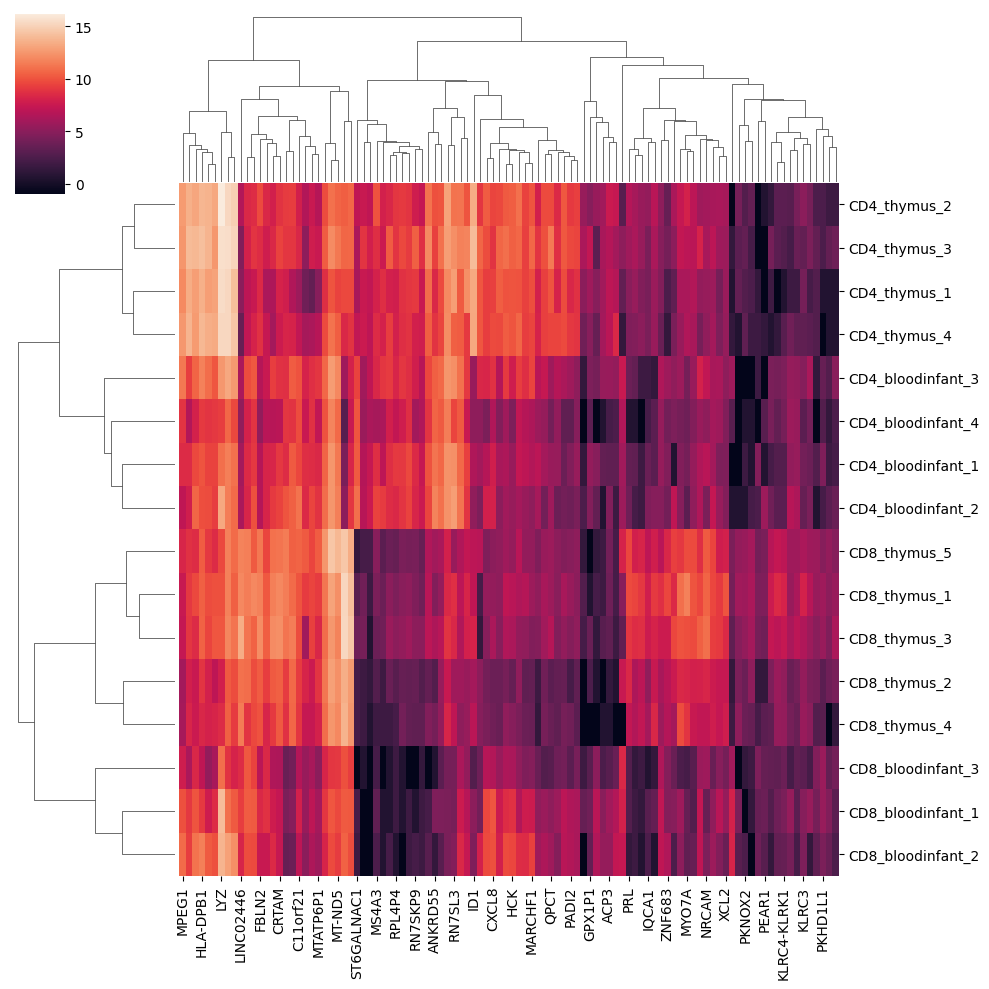

In [38]:
# Yes I can plot a cluster map of the GenestobePlotted
sns.clustermap(GenestobePlotted);

In [39]:
# Plot log 2-fold change of the genes of interest
# obtain mean log-2 expression across samples for each gene and store in data frame 'meanies' 

meanies = np.mean(GenestobePlotted,axis = 0) # across samples in the CD4 thymus group? 
meanies

IQCA1        4.38
MYO7A        6.26
ACP3         4.43
EIF3FP3      5.82
KLRC4        4.00
            ...  
SLC7A8       4.43
RPSAP15      3.81
MTATP6P1     7.52
EOMES        7.09
CD8B        10.55
Length: 102, dtype: float64

In [40]:
# obtain the difference between log2 expression and mean log2 expression 
GenestobePlotted_diff = GenestobePlotted - meanies
GenestobePlotted_diff

,IQCA1,MYO7A,ACP3,EIF3FP3,KLRC4,...,SLC7A8,RPSAP15,MTATP6P1,EOMES,CD8B
CD4_thymus_1,-0.10,-0.04,2.56,2.15,-5.00,...,-2.62,3.37,-2.64,-1.79,-0.90
CD4_thymus_2,0.96,1.73,3.09,2.44,-0.91,...,-0.15,3.27,-0.84,-1.30,0.18
CD4_thymus_3,-0.02,0.71,2.17,4.50,-0.91,...,-0.79,4.06,-0.07,1.01,0.14
CD4_thymus_4,-0.02,0.21,2.46,3.39,-2.68,...,-1.18,3.22,-0.76,-2.88,-1.73
CD4_bloodinfant_1,-0.74,-2.13,-1.18,2.77,-1.30,...,1.01,3.56,0.82,-0.69,-2.32
CD4_bloodinfant_2,0.17,-3.17,0.25,2.72,-0.91,...,1.93,3.73,1.28,-0.67,-1.59
CD4_bloodinfant_3,-2.57,-2.13,1.08,3.34,0.21,...,0.84,3.28,1.41,0.89,-2.54
CD4_bloodinfant_4,-2.21,-2.40,-2.26,2.08,-0.61,...,1.08,2.49,-0.35,-1.52,-3.14
CD8_thymus_1,3.44,5.39,-0.57,-0.80,4.43,...,1.86,-2.00,1.64,2.49,3.59
CD8_thymus_2,0.81,1.97,-3.10,-2.18,1.60,...,-0.30,-2.48,1.34,0.93,2.11


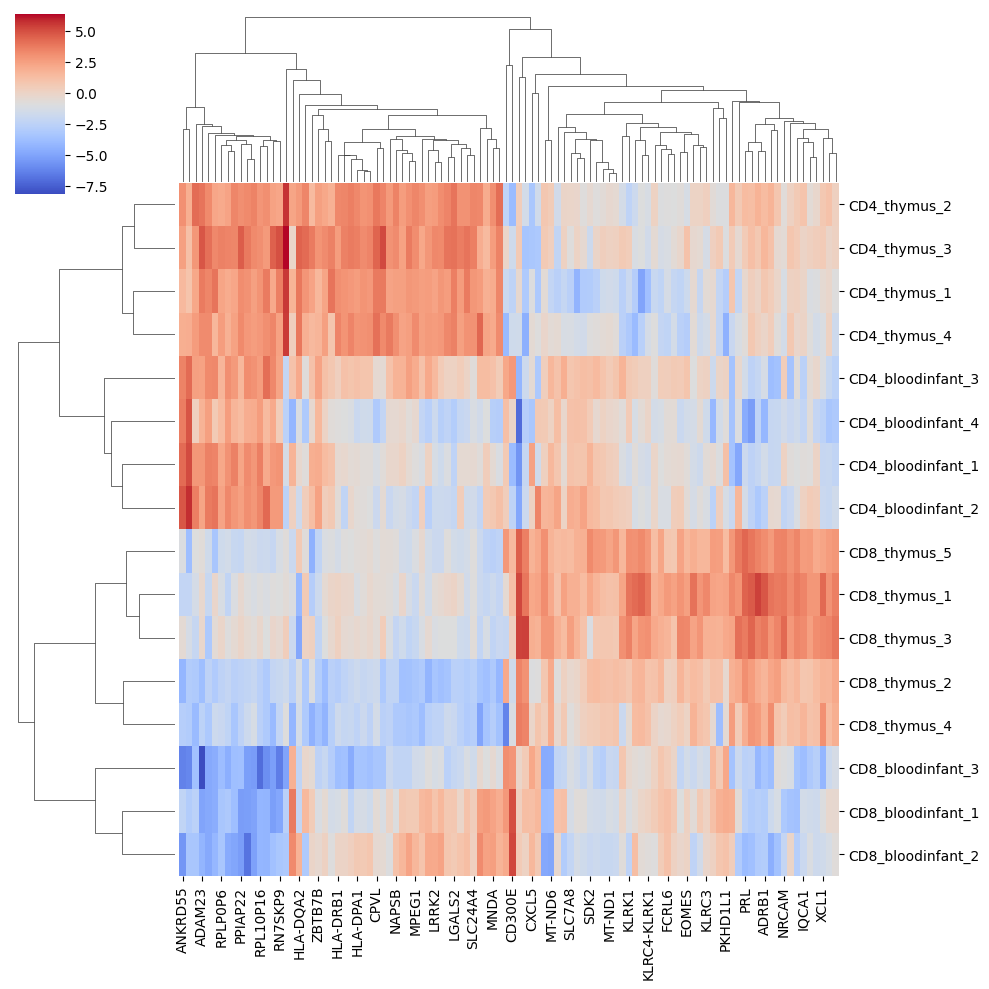

In [41]:
# Introduce divergent colour palette for clustermap 


sns.clustermap(GenestobePlotted_diff,cmap = 'coolwarm');

In [46]:
# Declaring colour dictionaries for the cluster map 

# Recall 

counts_log2 # sanity check for 'counts_log2' data frame

,A1BG,A1BG-AS1,A2M,A2M-AS1,A2ML1,...,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
CD4_thymus_1,5.71,7.86,5.57,6.64,1.81,...,10.77,12.22,9.08,11.80,12.71
CD4_thymus_2,5.54,8.27,6.10,6.48,4.55,...,11.66,12.60,10.74,12.60,13.09
CD4_thymus_3,7.46,9.56,6.18,7.96,5.38,...,12.46,13.67,10.30,13.13,14.21
CD4_thymus_4,5.99,8.49,5.27,7.03,6.65,...,11.52,12.04,10.58,12.48,12.77
CD4_bloodinfant_1,4.04,7.34,0.58,8.67,-1.00,...,11.64,12.44,10.80,12.44,13.35
CD4_bloodinfant_2,2.46,6.59,2.46,8.32,-1.00,...,11.82,12.55,11.50,13.08,13.51
CD4_bloodinfant_3,2.70,7.53,2.17,8.06,-1.00,...,11.51,12.40,10.75,12.75,13.10
CD4_bloodinfant_4,4.21,6.59,3.25,10.52,-1.00,...,11.36,11.73,9.96,12.82,12.80
CD8_thymus_1,5.57,9.66,6.91,7.38,8.19,...,11.32,11.62,11.64,13.06,12.52
CD8_thymus_2,3.25,7.82,6.48,4.21,5.41,...,9.17,9.87,9.54,10.85,10.87


In [47]:
meta # sanity check for 'meta' data frame

,CellType,Source,Replicate
SampleID,,,
CD4_thymus_1,CD4,thymus,1
CD4_thymus_2,CD4,thymus,2
CD4_thymus_3,CD4,thymus,3
CD4_thymus_4,CD4,thymus,4
CD4_bloodinfant_1,CD4,blood,1
CD4_bloodinfant_2,CD4,blood,2
CD4_bloodinfant_3,CD4,blood,3
CD4_bloodinfant_4,CD4,blood,4
CD8_thymus_1,CD8,thymus,1


In [49]:
# Adding color row annotations according to cell type and source, CD4 or CD8 and Thymus or Blood, respectively 
cell_type_cell_source = meta.loc[:,'CellType'] + '_' + meta.loc[:,'Source']
print(cell_type_cell_source)

SampleID
CD4_thymus_1         CD4_thymus
CD4_thymus_2         CD4_thymus
CD4_thymus_3         CD4_thymus
CD4_thymus_4         CD4_thymus
CD4_bloodinfant_1     CD4_blood
CD4_bloodinfant_2     CD4_blood
CD4_bloodinfant_3     CD4_blood
CD4_bloodinfant_4     CD4_blood
CD8_thymus_1         CD8_thymus
CD8_thymus_2         CD8_thymus
CD8_thymus_3         CD8_thymus
CD8_thymus_4         CD8_thymus
CD8_thymus_5         CD8_thymus
CD8_bloodinfant_1     CD8_blood
CD8_bloodinfant_2     CD8_blood
CD8_bloodinfant_3     CD8_blood
dtype: object


In [50]:
cell_type_cell_source

SampleID
CD4_thymus_1         CD4_thymus
CD4_thymus_2         CD4_thymus
CD4_thymus_3         CD4_thymus
CD4_thymus_4         CD4_thymus
CD4_bloodinfant_1     CD4_blood
CD4_bloodinfant_2     CD4_blood
CD4_bloodinfant_3     CD4_blood
CD4_bloodinfant_4     CD4_blood
CD8_thymus_1         CD8_thymus
CD8_thymus_2         CD8_thymus
CD8_thymus_3         CD8_thymus
CD8_thymus_4         CD8_thymus
CD8_thymus_5         CD8_thymus
CD8_bloodinfant_1     CD8_blood
CD8_bloodinfant_2     CD8_blood
CD8_bloodinfant_3     CD8_blood
dtype: object

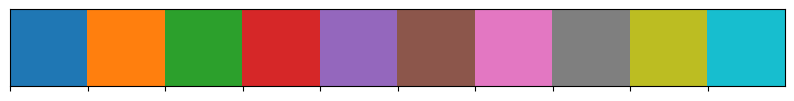

In [45]:

# Declaring colour dictionaries for the cluster map 

# Seaborn colour palette 

sns.palplot(sns.color_palette())




In [52]:
# find the set of unique cell line names.
celltypeandsourcenames = set(meta.loc[:,'CellType'] + '_' + meta.loc[:,'Source'])

In [53]:
# dictionarry associating cell line name to a color designation
cellColor = dict(zip(celltypeandsourcenames,sns.color_palette()))
print(cellColor)

{'CD4_thymus': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765), 'CD4_blood': (1.0, 0.4980392156862745, 0.054901960784313725), 'CD8_thymus': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313), 'CD8_blood': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392)}


In [54]:
cellColor

{'CD4_thymus': (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 'CD4_blood': (1.0, 0.4980392156862745, 0.054901960784313725),
 'CD8_thymus': (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 'CD8_blood': (0.8392156862745098, 0.15294117647058825, 0.1568627450980392)}

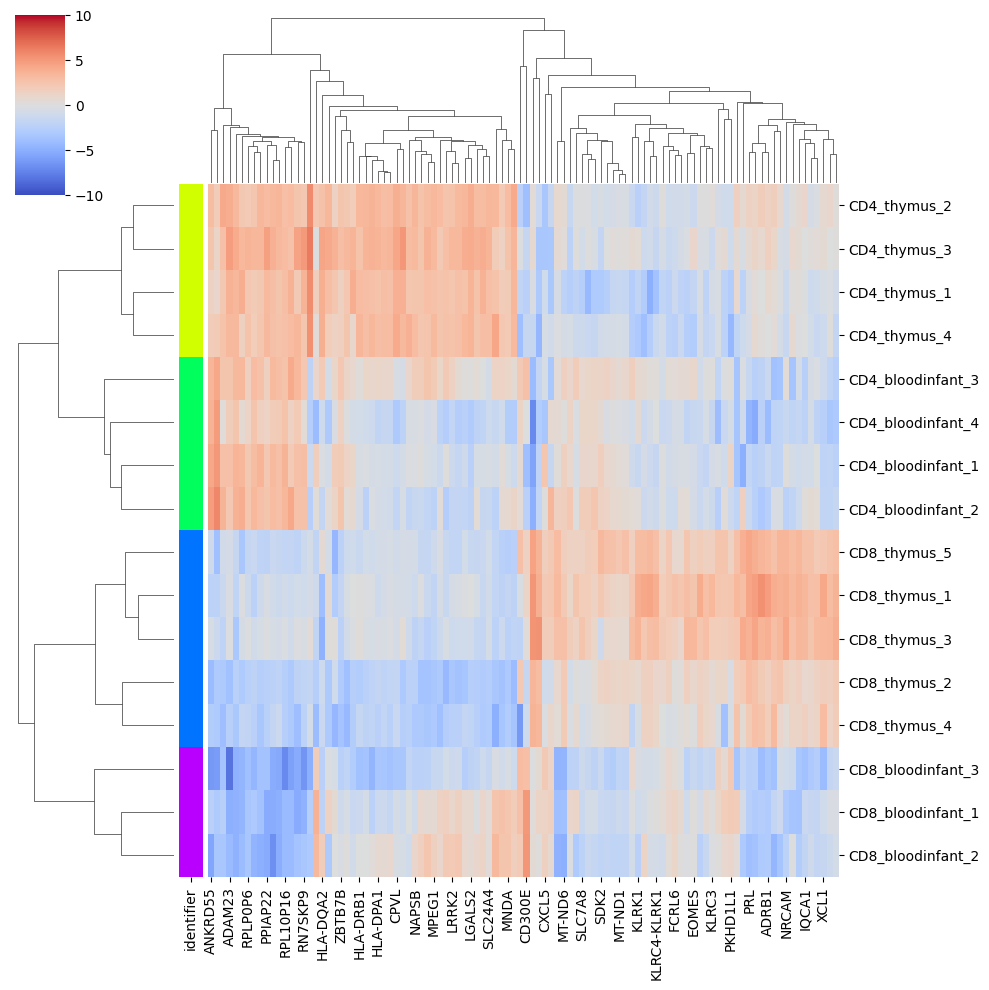

In [55]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure your data and meta are correctly defined
# data = pd.DataFrame(data)
# meta = pd.DataFrame(meta)  # Make sure there are 'CellType' and 'Source' columns

# Create a unique identifier by combining 'CellType' and 'Source'
meta['identifier'] = meta['CellType'] + '_' + meta['Source']

# Create a color palette for the unique identifiers
unique_identifiers = meta['identifier'].unique()
palette = sns.color_palette("hsv", len(unique_identifiers))
identifier_colors = dict(zip(unique_identifiers, palette))

# Map the colors to the DataFrame rows using 'identifier'
row_colors = meta['identifier'].map(identifier_colors)

# Assuming 'GenestobePlotted_diff' is correctly set up in your DataFrame
# Generate the clustermap
sns.clustermap(data=GenestobePlotted_diff, cmap='coolwarm', vmin=-10, vmax=10, row_colors=row_colors)

plt.show()




Based on the dendrogram that gets generated directly from `seaborn` with this clustermap, is expression from CD8 cells from the thymus more similar to expression from CD4 cells from the thymus or expression from CD8 cells from the blood?

According to this dendrogram, CD8 cells from thymus(blue) have more similar expression to CD4 cells from thymus(green), as opposed to CD8 Cells from the blood( purple). 

5. Calculate the dendrogram for the genes featured in the clustermap of Question 4, based on Pearson Distance calculated from the log2 expression fold change data used to generate the clustergram. *Hint*: you'll need to use `hc.dendrogram()` and `hc.linkage`. Use a threshold value of 0.15 to define the cluster groupings.

Based on the threshold of 0.15, how many genes are in the largest cluster? What are these genes?

<Figure size 1000x700 with 0 Axes>

Text(0.5, 1.0, 'Gene Expression Dendrogram')

Text(0.5, 0, 'Genes')

Text(0, 0.5, 'Distance')

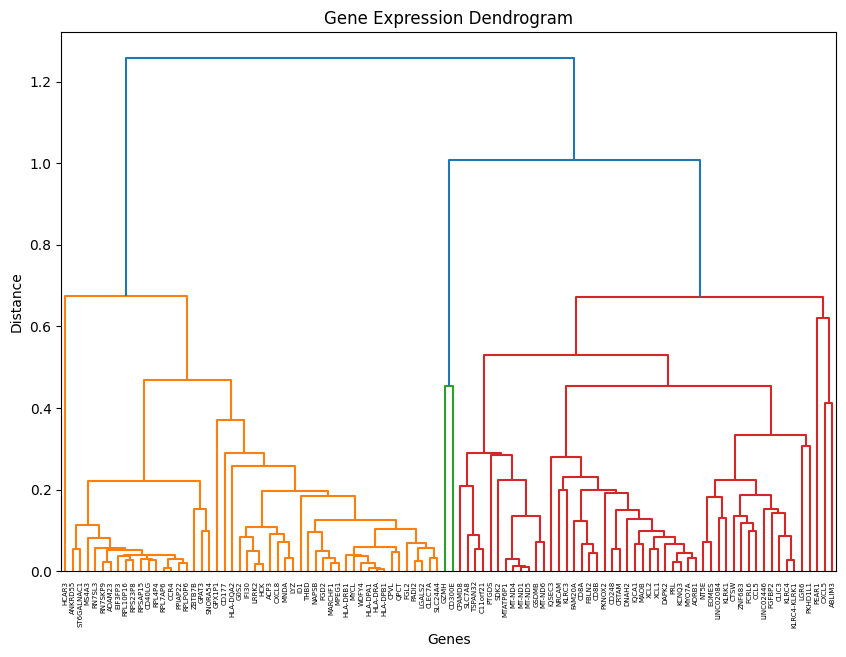

Largest cluster size: 18
Genes in the largest cluster: ['FGD2', 'CPVL', 'MYCL', 'WDFY4', 'HLA-DRA', 'HLA-DPA1', 'MARCHF1', 'PADI2', 'LGALS2', 'THBD', 'HLA-DRB1', 'NAPSB', 'CLEC7A', 'MPEG1', 'HLA-DPB1', 'FGL2', 'SLC24A4', 'QPCT']


In [69]:
import pandas as pd
import scipy.cluster.hierarchy as hc
import scipy.spatial.distance as ssd
import numpy as np
import matplotlib.pyplot as plt

# Transpose DataFrame to have genes as rows
data_transposed = GenestobePlotted_diff.transpose()

# Calculate Pearson correlation matrix for genes
corr_matrix = np.corrcoef(data_transposed)

# Transform correlation matrix to a distance matrix
distance_matrix = 1 - corr_matrix

# Convert the full matrix to a condensed distance matrix needed by hc.linkage
condensed_distance_matrix = ssd.squareform(distance_matrix, checks=False)

# Calculate the linkage matrix using an appropriate method
linkage_matrix = hc.linkage(condensed_distance_matrix, method='average')

# Plot the dendrogram for genes
plt.figure(figsize=(10, 7))
dendrogram = hc.dendrogram(linkage_matrix, labels=data_transposed.index, leaf_rotation=90)
plt.title('Gene Expression Dendrogram')
plt.xlabel('Genes')
plt.ylabel('Distance')
plt.show()

# Define clusters with a threshold of 0.15
clusters = hc.fcluster(linkage_matrix, 0.15, criterion='distance')
gene_clusters = pd.Series(clusters, index=data_transposed.index)

# Determine the largest cluster
most_common_cluster = gene_clusters.mode()[0]
largest_cluster_genes = gene_clusters[gene_clusters == most_common_cluster]

# Output results
print("Largest cluster size:", len(largest_cluster_genes))
print("Genes in the largest cluster:", largest_cluster_genes.index.tolist())
